In [1]:
import os
import zipfile
import json
import shutil
import tempfile
import base64
import zlib
import cv2
import numpy as np
import argparse
from PIL import Image
import random
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import seaborn as sns

# SPLIT DATASET

## filter dataset

In [ ]:
def filter_coco_annotations(json_path, output_path, categories, selected_classes):
    # Load the JSON file
    with open(json_path, 'r') as file:
        coco_data = json.load(file)
    
    # Map selected class names to their category ids
    selected_category_ids = {cat['id'] for cat in categories if cat['name'] in selected_classes}
    print(selected_category_ids)
    
    # Filter annotations
    filtered_annotations = [ann for ann in coco_data['annotations'] if ann['category_id'] in selected_category_ids]
    
    # Filter categories to keep only the selected ones
    filtered_categories = [cat for cat in coco_data['categories'] if cat['id'] in selected_category_ids]
    
    # Get the image_ids from the filtered annotations
    selected_image_ids = {ann['image_id'] for ann in filtered_annotations}
    
    # Filter images to keep only the ones that have the filtered annotations
    filtered_images = [img for img in coco_data['images'] if img['id'] in selected_image_ids]
    
    # Create the new filtered data
    filtered_coco_data = {
        'images': filtered_images,
        'annotations': filtered_annotations,
        'categories': filtered_categories
    }
    
    # Save the filtered annotations to a new file
    with open(output_path, 'w') as output_file:
        json.dump(filtered_coco_data, output_file, indent=4)

# Example usage
json_path = os.path.join(train_folder, "_annotations.coco.json")
output_path = os.path.join(train_folder, "_filtered_annotations.coco.json")
selected_classes = ["camping car", "car", "pickup", "truck", "van"]

filter_coco_annotations(json_path, output_path, categories, selected_classes)


# DATASET ANALYSIS

In [4]:
# Step 3: Function to count class instances from a COCO annotation file
def count_classes(coco_json_path):
    with open(coco_json_path, 'r') as file:
        data = json.load(file)
    
    # Dictionary to count class occurrences
    class_counts = defaultdict(int)

    # Extract categories (class names)
    categories = {cat['id']: cat['name'] for cat in data['categories']}

    # Count how many times each class appears
    for annotation in data['annotations']:
        class_id = annotation['category_id']
        class_name = categories[class_id]
        class_counts[class_name] += 1

    return class_counts


    
def plot_class_distribution(class_counts):
    # Sort classes alphabetically for consistent plotting
    all_classes = sorted(class_counts.keys())

    # Prepare data for plotting
    values = [class_counts[cls] for cls in all_classes]

    # Plotting
    plt.figure(figsize=(6, 4))
    bars = plt.bar(all_classes, values, color='blue')

    # Annotate each bar with its height (number of instances)
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # x-coordinate for the text
            height,  # y-coordinate for the text
            f'{int(height)}',  # The text to display
            ha='center',  # Horizontal alignment
            va='bottom'  # Vertical alignment
        )

    plt.xlabel('Classes')
    plt.ylabel('Number of Instances')
    plt.title('Class Distribution for Vehicle Dataset')
    #plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()
    
def count_objects_and_areas(json_path):
    with open(json_path, 'r') as file:
        data = json.load(file)
    
    # Extract annotations
    image_counts = defaultdict(lambda: defaultdict(int))
    image_area_proportions = defaultdict(lambda: defaultdict(int))  # Store area proportions as a list per image
    annotations = data['annotations']

    # Load image sizes
    image_sizes = {image['id']: (image['width'], image['height']) for image in data['images']}
    
    # Count the number of objects and calculate area proportions
    for annotation in annotations:
        image_id = annotation['image_id']
        category_id = annotation['category_id']
        
        # Increment count for the specific image and category
        image_counts[category_id][image_id] += 1
        
        # Calculate the area proportion
        if image_id in image_sizes:
            width, height = image_sizes[image_id]
            total_image_area = width * height
            area_proportion = annotation['area'] / total_image_area  # Proportion of the image area covered by the object
            image_area_proportions[category_id][image_id] = area_proportion  # Append proportions for each image
    
    return image_counts, image_area_proportions


def plot_histograms(object_counts_per_image, area_proportions_per_class, categories):
    # Loop over each class in object counts
    for obj_class, counts in object_counts_per_image.items():
            # Extract object counts for the class
            object_counts = list(counts.values())
            mean_object_count = np.mean(object_counts)
            cat = categories[obj_class]['name']
            
            # Create a figure for the histograms
            plt.figure(figsize=(6, 5))

            # Plot the histogram for Number of Objects
            #plt.subplot(1, 2, 1)
            sns.histplot(object_counts, bins=50, kde=False)
            plt.title(f'Distribution of the Number of Objects (Class {cat})', fontsize=12)
            plt.xlabel('Number of Objects')
            plt.ylabel('Number of Images')
            plt.axvline(mean_object_count, color='red', linestyle='--', label=f'Mean: {mean_object_count:.2f}')
            plt.grid()
            plt.legend()
            
            plt.tight_layout()
            plt.show()

    for obj_class, counts in area_proportions_per_class.items():
            # Convert defaultdict to a list before calculating the mean
            area_proportions = list(counts.values())
            mean_area_proportion = np.mean(area_proportions)
            cat = categories[obj_class]['name']
            plt.figure(figsize=(6, 5))

            # Plot the histogram for Area Proportions
            #plt.subplot(1, 2, 2)
            sns.histplot(area_proportions, bins=50, kde=False)
            plt.title(f'Distribution of Area Proportion Covered by Objects (Class {cat})', fontsize=12)
            plt.xlabel('Area Proportion')
            plt.ylabel('Number of Images')
            plt.axvline(mean_area_proportion, color='red', linestyle='--', label=f'Mean: {mean_area_proportion:.2f}')
            plt.grid()
            plt.legend()

            # Adjust layout and show the figure
            plt.tight_layout()
            plt.show()


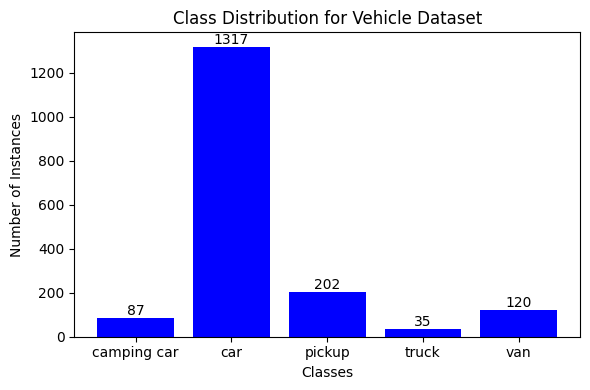

In [5]:
plot_class_distribution(count_classes("YOLO-World/vehicle_detection_satellite_coco/final_annotations.json"))

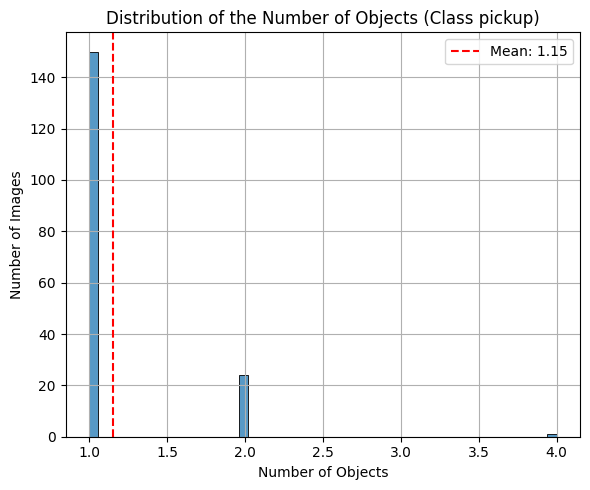

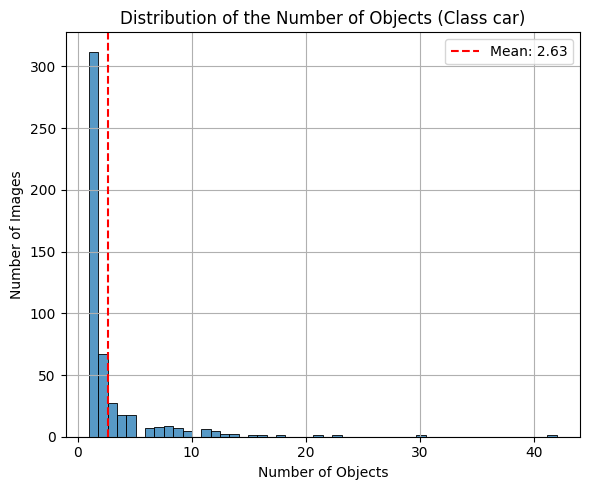

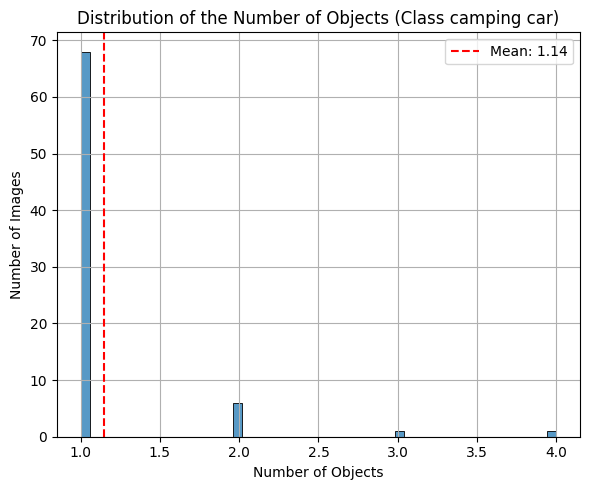

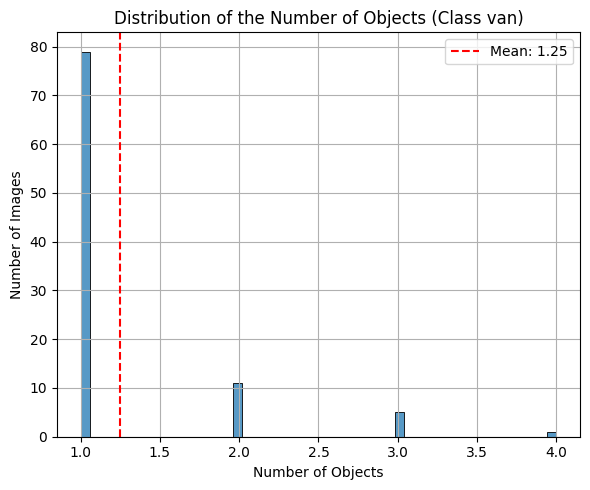

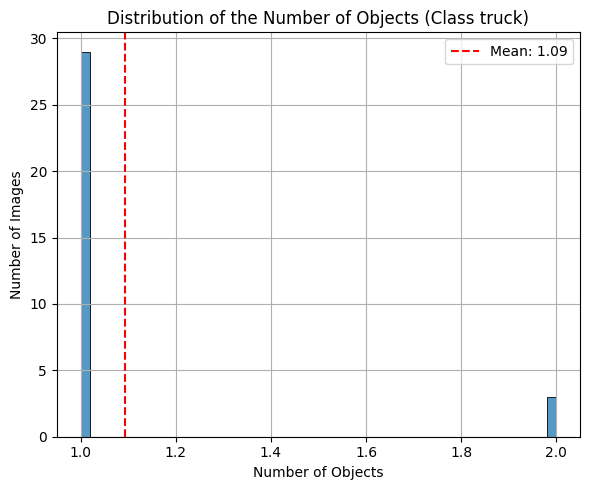

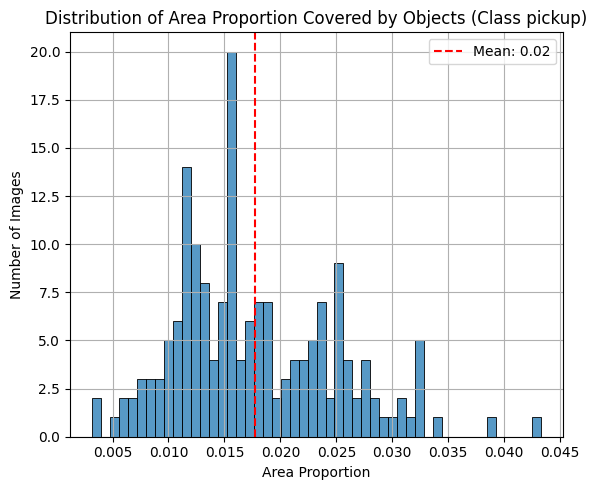

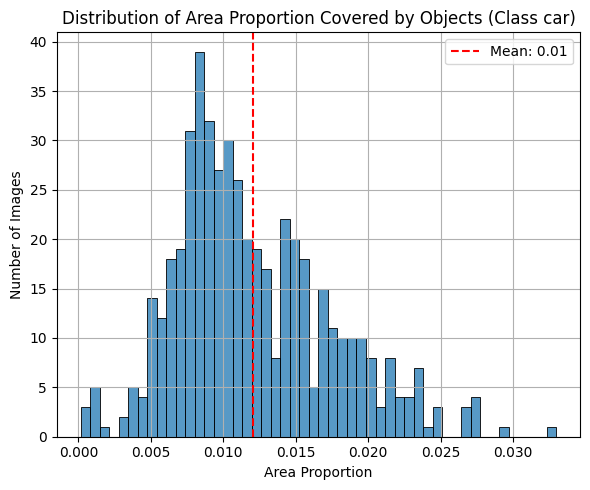

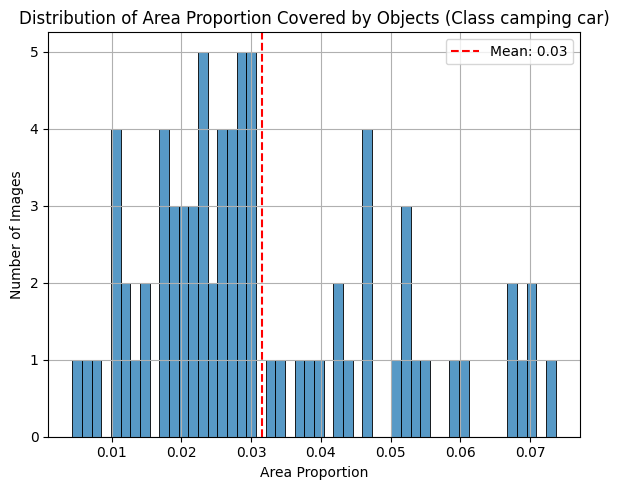

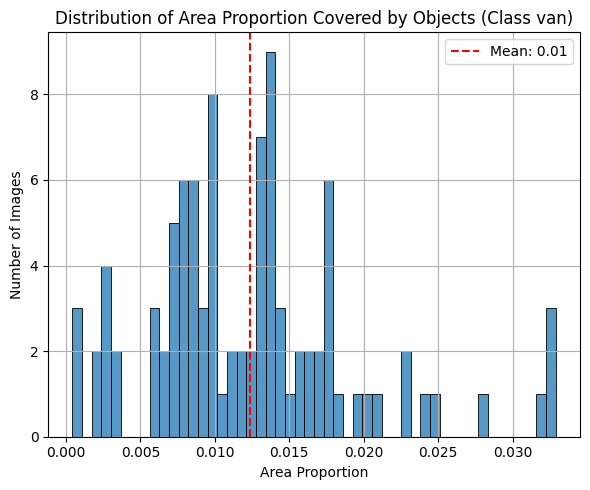

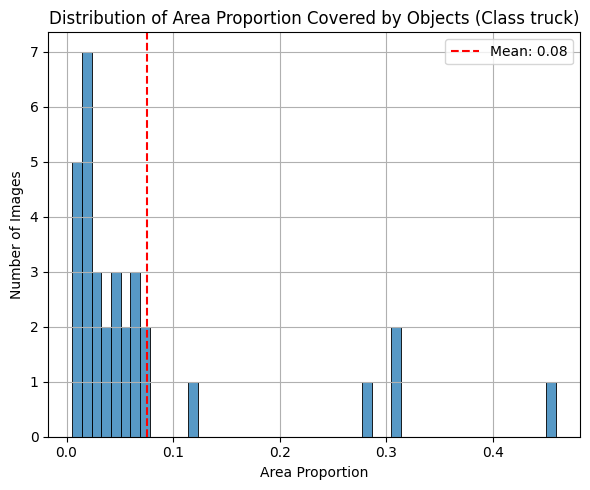

In [7]:
object_counts, area_proportions = count_objects_and_areas("YOLO-World/vehicle_detection_satellite_coco/final_annotations.json")
categories = [{"id":0,"name":"camping car","supercategory":"Cars-Trucks-Vans"},{"id":1,"name":"car","supercategory":"Cars-Trucks-Vans"},{"id":2,"name":"pickup","supercategory":"Cars-Trucks-Vans"},{"id":3,"name":"truck","supercategory":"Cars-Trucks-Vans"},{"id":4,"name":"van","supercategory":"Cars-Trucks-Vans"}]
plot_histograms(object_counts, area_proportions, categories)

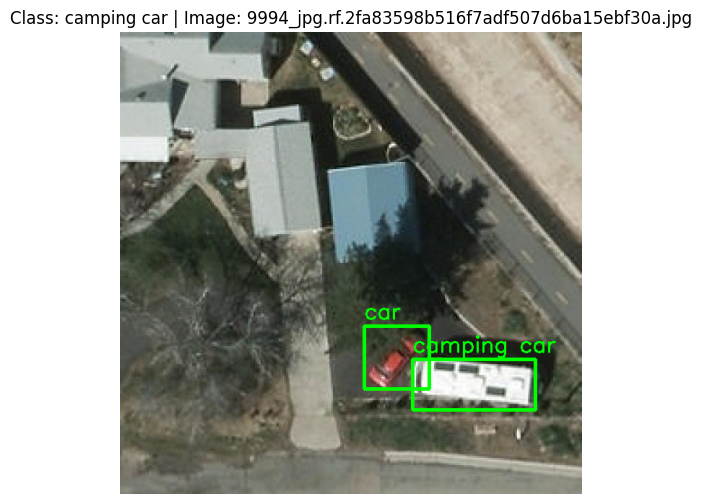

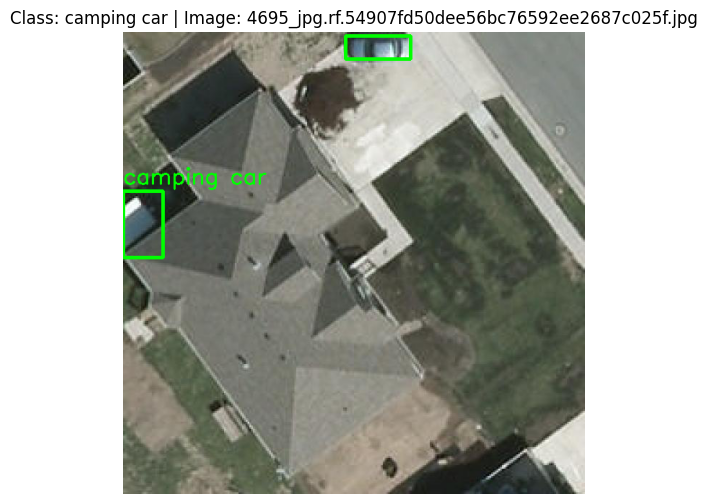

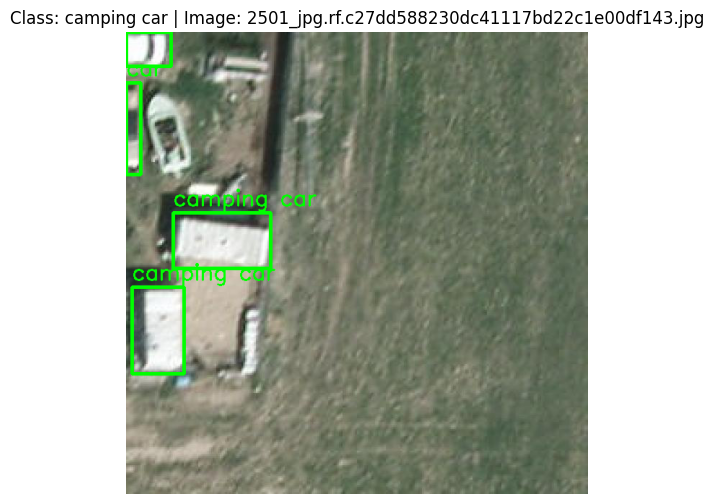

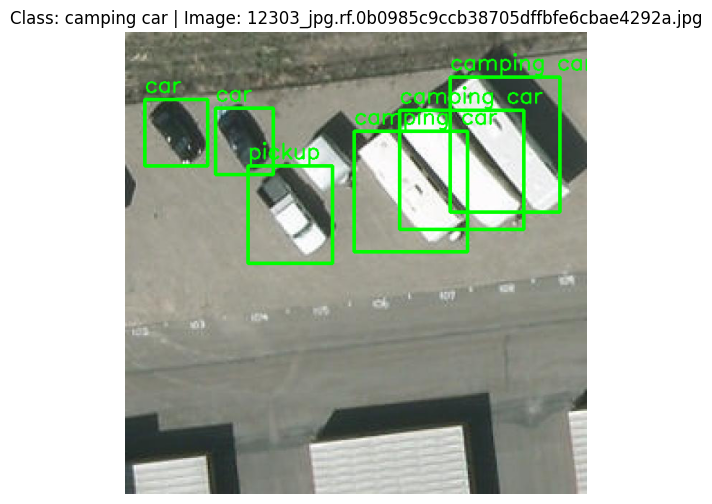

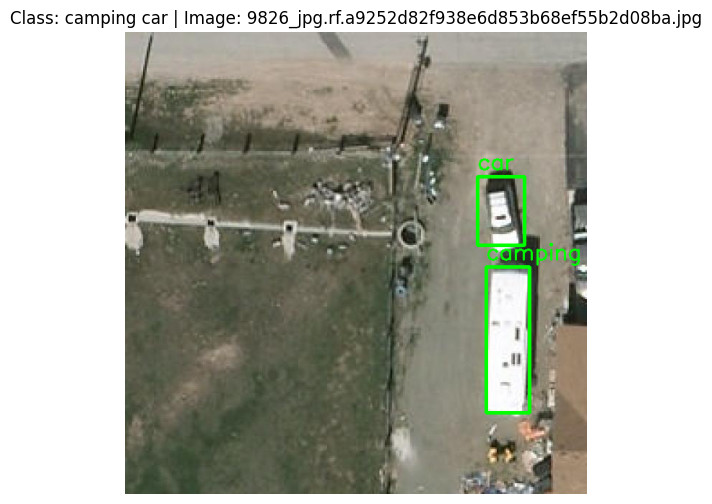

...

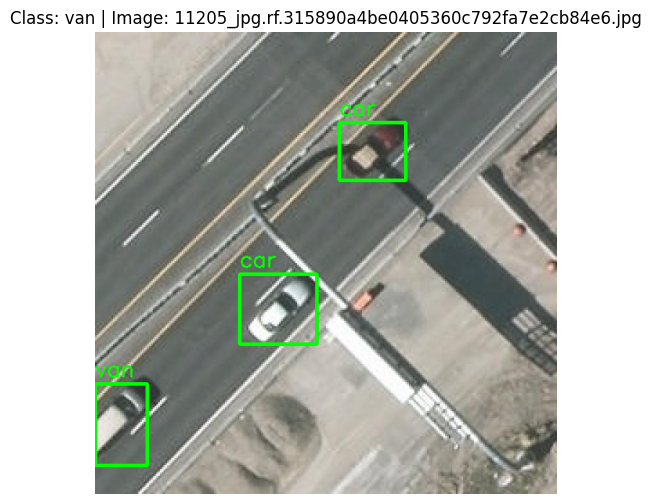

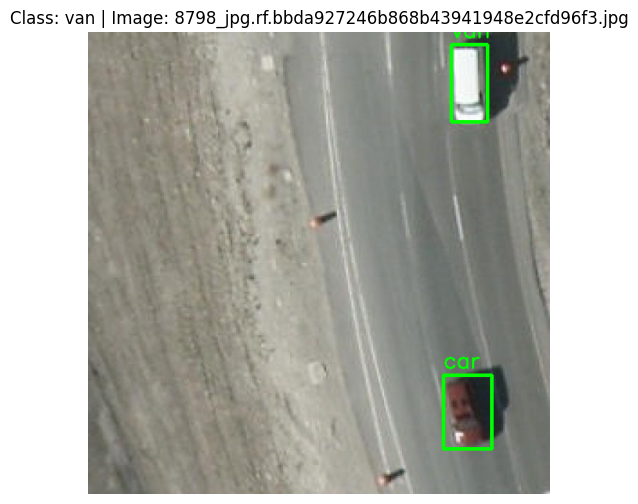

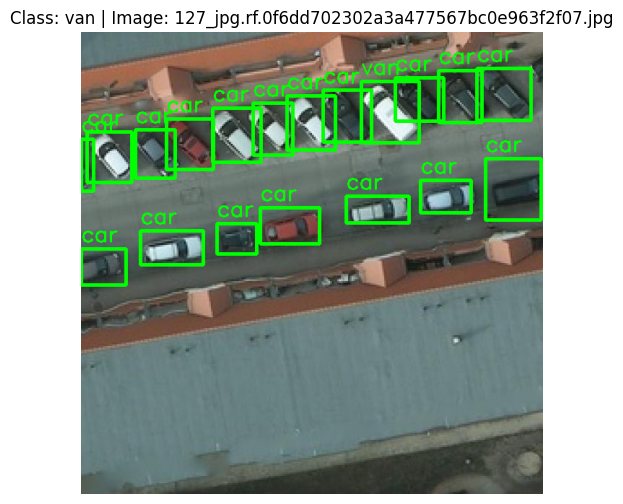

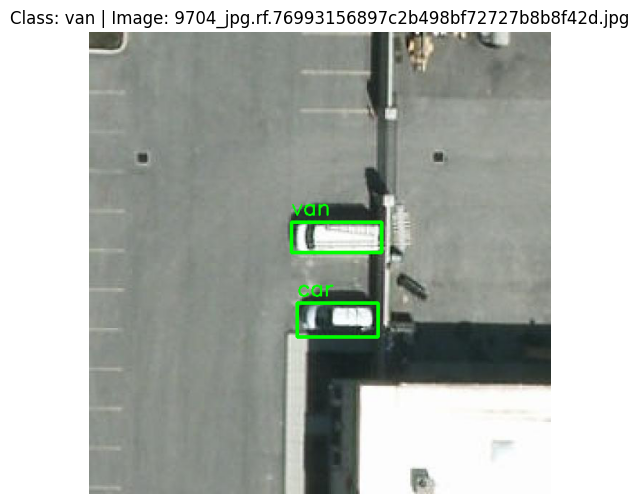

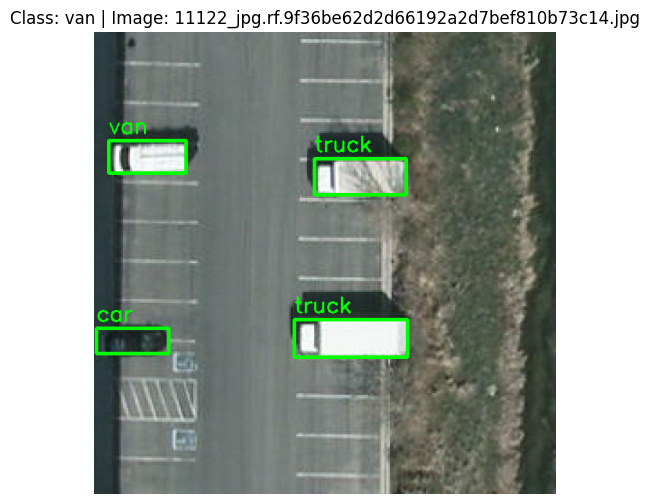

In [5]:
images_folder = "vehicle_detection_satellite_coco/final_images"
coco_annotation_file = "vehicle_detection_satellite_coco/final_annotations.json"

# Step 3: Load the COCO annotation file
with open(coco_annotation_file, 'r') as f:
    coco_data = json.load(f)

# Step 4: Parse the COCO data to organize annotations by image
annotations_by_image = defaultdict(list)
for annotation in coco_data['annotations']:
    image_id = annotation['image_id']
    annotations_by_image[image_id].append(annotation)

# Map image IDs to file names
image_id_to_file = {image['id']: image['file_name'] for image in coco_data['images']}

# Step 5: Define function to plot bounding boxes on an image
def plot_bounding_boxes(image, annotations, categories):
    # Convert image to RGB for plotting
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Loop over annotations and draw bounding boxes
    for ann in annotations:
        x, y, width, height = ann['bbox']
        class_id = ann['category_id']
        class_name = categories[class_id]

        # Define color for bounding box
        color = (0, 255, 0)

        # Draw the bounding box
        cv2.rectangle(img_rgb, (int(x), int(y)), (int(x + width), int(y + height)), color, 3)

        # Put class name above the bounding box
        cv2.putText(img_rgb, class_name, (int(x), int(y) - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)

    return img_rgb

# Step 6: Display a few sample images for each selected class
def display_sample_images_per_class(selected_classes, num_samples=5):
    # Get the categories (class names)
    categories = {cat['id']: cat['name'] for cat in coco_data['categories']}
    
    # Get selected class IDs based on the selected class names
    selected_class_ids = {cat['id']: cat['name'] for cat in coco_data['categories'] if cat['name'] in selected_classes}

    # Loop over each selected class
    for class_id, class_name in selected_class_ids.items():
        # Find all images that contain the selected class
        images_with_class = [
            image_id for image_id, annotations in annotations_by_image.items() 
            if any(ann['category_id'] == class_id for ann in annotations)
        ]
        
        # Select a random sample of images with the selected class
        sample_images = random.sample(images_with_class, min(len(images_with_class), num_samples))
        
        for image_id in sample_images:
            file_name = image_id_to_file[image_id]
            
            # Get the corresponding annotations
            annotations = annotations_by_image[image_id]

            # Load the image
            img_path = os.path.join(images_folder, file_name)
            img = cv2.imread(img_path)

            if img is None:
                print(f"Image {file_name} not found, skipping...")
                continue
            
            # Plot bounding boxes on the image
            img_with_boxes = plot_bounding_boxes(img, annotations, categories)
            
            # Display the image
            plt.figure(figsize=(6, 6))
            plt.imshow(img_with_boxes)
            plt.title(f"Class: {class_name} | Image: {file_name}")
            plt.axis('off')
            plt.show()

# Example usage: Display 3 sample images for each selected class
selected_classes = ["camping car", "car", "pickup", "truck", "van"]
display_sample_images_per_class(selected_classes, num_samples=10)
